# Solution to New York Taxi Fare Prediction Problem

## Introduction

**Bonjour!!!**

Comment allez-vous?

Je m'appelle **Bruno Ábia**, J'ai fait une petite présentation dans le meetup Techo Drink Sherbrooke. Ici, vous trouverez tous les examples que j'ai utilisé. 

Si vous avez de question, n'hesite pas de m'envoyer un courriel (**bruno.abia@gmail.com**). Vous pouvez envoyer le courriel en **français**, **anglais** ou **portugais** =D


- Pour me contacter: 
[LinkedIn](https://www.linkedin.com/in/brunoabia/), [Github](https://github.com/brunoasouza)


Si vous voulez savoir plus sur les tools que j'ai utilisé, vous trouverez tous les links:

1. [Scikit-learn](https://scikit-learn.org/stable/index.html)
2. [Shap Values](https://github.com/slundberg/shap)
3. [Back-testing](https://towardsdatascience.com/three-approaches-for-backtesting-historical-data-aee7783b9e64)
4. [Autopep8](https://github.com/hhatto/autopep8)
5. [XGBOOST](https://xgboost.readthedocs.io/en/latest/)
6. [Dataset](https://www.kaggle.com/c/new-york-city-taxi-fare-prediction/data)


Ce ne est pas necessaire faire la instalation de les tools pour commancer a travailler, parce que j'ai disponibilisé une file requiriments pour vous aider.

In [199]:
import pandas as pd
import matplotlib
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import math
import numpy
import random
import os
import shap
from xgboost import XGBRegressor
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score
from sklearn import preprocessing
from sklearn.metrics import r2_score

# Data Loading Process 

Considering the amount of data (about 55 million rows) and the limited computational resources I had available, I started by collecting a random sample of 10% of the data (about 5,5 million rows) for performing experiments.

In [57]:
p = 0.1 # 10% of the lines

#Reading csv data applying a lambda function with a random 
# train_data = pd.read_csv('data/train.csv/train.csv',header=0, skiprows=lambda i: i>0 and random.random() > p)
train_data  = pd.read_csv('data/dataset_taxi.csv')
target_data = pd.read_csv('data/dataset_taxi_targets.csv')
# A quick look at the data formatting
train_data.head()

,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,year,month,date,dow,hour,minute,distance
0,-73.844311,40.721319,-73.841610,40.712278,1,2009,6,15,0,17,26,1.031055
1,-73.987130,40.733143,-73.991567,40.758092,1,2012,4,21,5,4,30,2.800061
2,-74.006462,40.726713,-73.993078,40.731628,1,2012,12,3,0,13,10,1.253586
3,-73.996335,40.737142,-73.980721,40.733559,1,2012,4,8,6,7,30,1.374965
4,-73.986430,40.760465,-73.988990,40.737075,1,2014,2,19,2,7,22,2.610512


In [59]:
result = pd.concat([train_data, target_data], axis=1, sort=False)

In [61]:
train_data = result

In [62]:
#A general overview of the available data sample
train_data.describe()

,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,year,month,date,dow,hour,minute,distance,fare_amount
count,5.380832e+06,5.380832e+06,5.380832e+06,5.380832e+06,5.380832e+06,5.380832e+06,5.380832e+06,5.380832e+06,5.380832e+06,5.380832e+06,5.380832e+06,5.380832e+06,5.380832e+06
mean,-7.383585e+01,4.065343e+01,-7.384146e+01,4.065655e+01,1.685427e+00,2.011741e+03,6.266151e+00,1.571837e+01,3.041483e+00,1.351455e+01,2.958347e+01,2.009030e+01,1.129419e+01
std,3.548959e+00,2.848410e+00,3.480081e+00,2.828784e+00,1.308768e+00,1.863666e+00,3.436211e+00,8.683616e+00,1.948410e+00,6.517817e+00,1.732996e+01,3.729126e+02,9.353263e+00
min,-1.219259e+02,-7.401718e+01,-1.219261e+02,-7.417780e+01,0.000000e+00,2.009000e+03,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,8.395848e-05,0.000000e+00
25%,-7.399227e+01,4.073651e+01,-7.399158e+01,4.073553e+01,1.000000e+00,2.010000e+03,3.000000e+00,8.000000e+00,1.000000e+00,9.000000e+00,1.500000e+01,1.279236e+00,6.000000e+00
50%,-7.398210e+01,4.075335e+01,-7.398060e+01,4.075384e+01,1.000000e+00,2.012000e+03,6.000000e+00,1.600000e+01,3.000000e+00,1.400000e+01,3.000000e+01,2.179884e+00,8.500000e+00
75%,-7.396837e+01,4.076752e+01,-7.396539e+01,4.076837e+01,2.000000e+00,2.013000e+03,9.000000e+00,2.300000e+01,5.000000e+00,1.900000e+01,4.500000e+01,3.957828e+00,1.250000e+01
max,1.041068e+02,7.400668e+01,7.400000e+01,8.328333e+01,9.000000e+00,2.015000e+03,1.200000e+01,3.100000e+01,6.000000e+00,2.300000e+01,5.900000e+01,1.969436e+04,1.000000e+02


# Data Cleaning Process

A first data overview produced some general insights:

- The feature 'Pickup Datetime' is in datetime format: we need to split it in different numerical features, in order to evaluate the impact of each variable (year, month, day of week, hours and minutes, etc) in the fare prediction task.
- Latitude data must be in range (-90, 90) and Longitude must be in range (-180, 180). By displaying the maximum and minimum values, we can detect some outliers outside this range: we need to limit the pickup and dropoff latitudes and longitudes between those ranges.
- An apparent outlier can also be spotted in 'passenger_count' feature maximum value - in this case, I'll perform a further analysis in order to understand the distribution of this data.

In this step, we also remove lines containing 'NaN' values to guarantee the integrity of our model.


In [6]:
#Dropping lines containing NaN values

train_data = train_data.dropna()

#Splitting Datetime values to different feature columns

train_data['pickup_datetime'] = pd.to_datetime(train_data['pickup_datetime'], infer_datetime_format=True)
train_data['year'] = train_data['pickup_datetime'].dt.year
train_data['month'] = train_data['pickup_datetime'].dt.month
train_data['date'] = train_data['pickup_datetime'].dt.day
train_data['dow'] = train_data['pickup_datetime'].dt.dayofweek
train_data['hour'] = train_data['pickup_datetime'].dt.hour
train_data['minute'] = train_data['pickup_datetime'].dt.minute

#Removing key and pickup datetime columns 
train_data = train_data.drop(['key', 'pickup_datetime'], axis=1)

#Limiting ranges for latitude and longitude data
train_data = train_data[train_data['pickup_latitude'].between(-90, 90, inclusive=True)] 
train_data = train_data[train_data['dropoff_longitude'].between(-180, 180, inclusive=True)] 
train_data = train_data[train_data['pickup_longitude'].between(-180, 180, inclusive=True)] 
train_data = train_data[train_data['dropoff_latitude'].between(-90, 90, inclusive=True)] 

C:\Users\b.souza\AppData\Local\Continuum\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
C:\Users\b.souza\AppData\Local\Continuum\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\b.souza\AppData\Local\Continuum\anaconda3\envs\py37\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try us

Text(0.5, 1.0, 'Passenger Count Distribution')

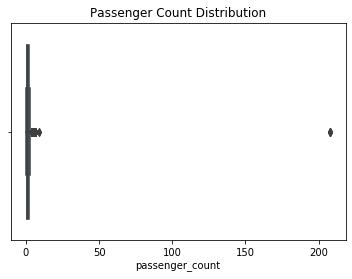

In [7]:
#Plotting a boxplot of 'Passenger Count' feature in order to 
#check the quartiles containing the major data distribution 
#in order to remove outliers.

sns.boxplot(x=train_data['passenger_count']).set_title("Passenger Count Distribution")

We can see by the boxplot that the majority of data distribution is in a range between 0 and 10 (possibly less than 10, considering an average car size) - because of this, I will consider a limit between 0 and 10 passengers.

Text(0.5, 1.0, 'Passenger Count Distribution (After Cleaning Process)')

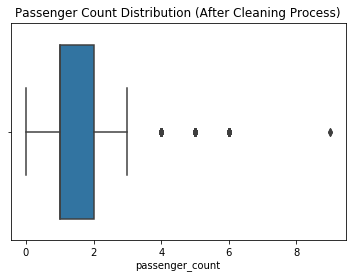

In [8]:
train_data = train_data[train_data['passenger_count'].between(0,10, inclusive=True)] 

sns.boxplot(x=train_data['passenger_count']).set_title("Passenger Count Distribution (After Cleaning Process)")

We can see a more realistic passenger count distribution above. 

# Data Analysis and Insights

In the next step, before actually applying a regression model I will perform a further investigation on data correlation to answer the questions below:

- Is there any correlation between travel pickup time (hour, day of the week, month, year) and the Fare price?
- Is there any correlation between passenger count and the Fare price?


Text(0.5, 0.98, 'Correlation Between Years and Taxi Fares')

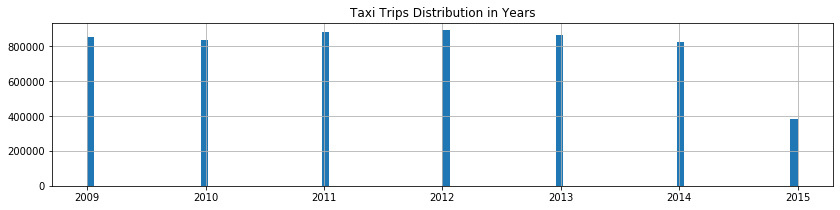

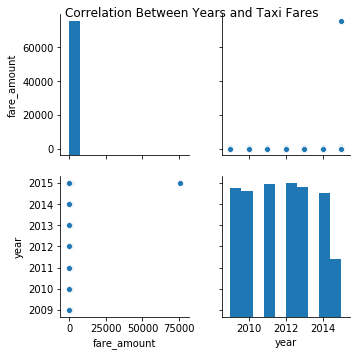

In [9]:
train_data.year.hist(bins=100, figsize=(14,3)).set_title("Taxi Trips Distribution in Years")

sns.pairplot(train_data[['fare_amount', 'year']]).fig.suptitle("Correlation Between Years and Taxi Fares")


Apparently there is a direct linear correlation between Fare Amount/Year, with taxi fare prices increasing over the years)

Text(0.5, 0.98, 'Correlation Between Months and Taxi Fares')

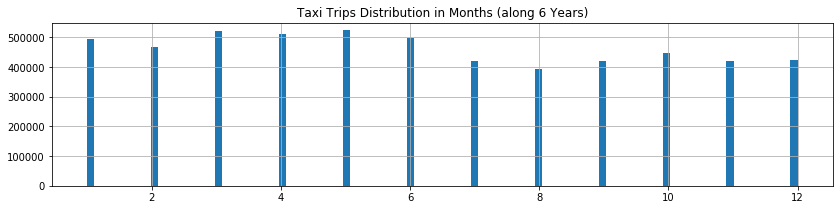

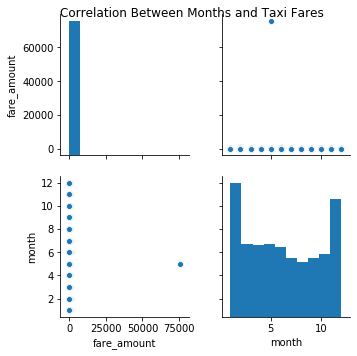

In [10]:
train_data.month.hist(bins=100, figsize=(14,3)).set_title("Taxi Trips Distribution in Months (along 6 Years)")
sns.pairplot(train_data[['fare_amount', 'month']]).fig.suptitle("Correlation Between Months and Taxi Fares")

A direct linear correlation can also be verified between Fare Amount/Months, with taxi fare prices increasing over the months

Text(0.5, 0.98, 'Correlation Between Ride Hour and Taxi Fares')

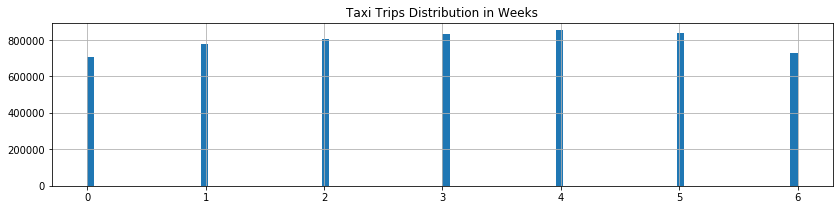

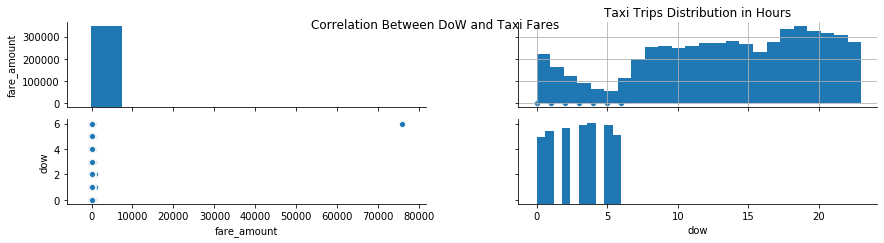

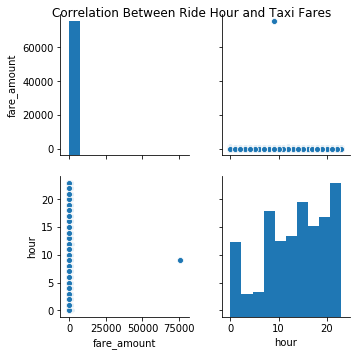

In [11]:
train_data.dow.hist(bins=100, figsize=(14,3)).set_title("Taxi Trips Distribution in Weeks")

sns.pairplot(train_data[['fare_amount', 'dow']]).fig.suptitle("Correlation Between DoW and Taxi Fares")

train_data.hour.hist(bins=24, figsize=(14,3)).set_title("Taxi Trips Distribution in Hours")

sns.pairplot(train_data[['fare_amount', 'hour']]).fig.suptitle("Correlation Between Ride Hour and Taxi Fares")


No linear correlation could be immediately observed between DoW and Taxi Fares neither between Hours and Taxi Fares.

Below, we investigate the range distribution of Fare Prices, in order to detect outliers on the target values.

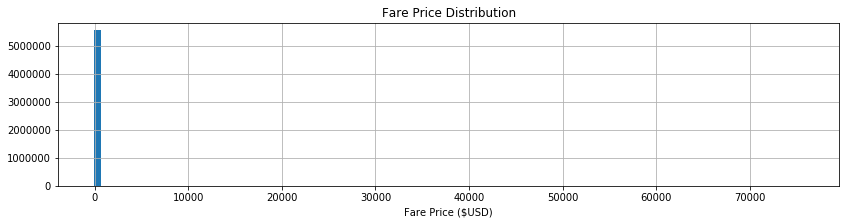

In [12]:
train_data.fare_amount.hist(bins=100, figsize=(14,3))
plt.xlabel('Fare Price ($USD)')
plt.title('Fare Price Distribution');

Most of the fare prices are distributed 0 and 100. I will restrict the values to this range to disconsider outliers above and below (considering negative Fare values would not make sense in this context)

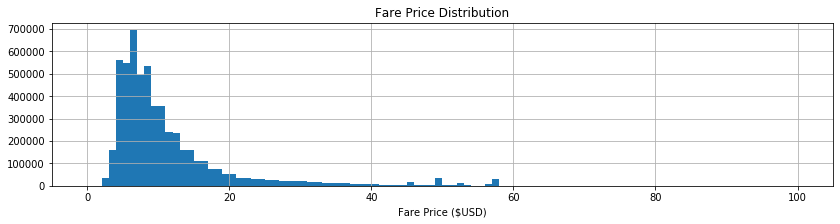

In [13]:
train_data = train_data[train_data['fare_amount'].between(0, 100, inclusive=True)] 
train_data.fare_amount.hist(bins=100, figsize=(14,3))
plt.xlabel('Fare Price ($USD)')
plt.title('Fare Price Distribution');

## Visualization

### Function to create the plots

In [99]:
# this function will be used more often to plot data on the NYC map
def plot_on_map(df, BB, nyc_map, target="", s=10, alpha=0.2):
    fig, axs = plt.subplots(1, 2, figsize=(16,10))
    axs[0].scatter(df.pickup_longitude, df.pickup_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[0].set_xlim((BB[0], BB[1]))
    axs[0].set_ylim((BB[2], BB[3]))
    axs[0].set_title('Pickup locations '+ str(target))
    axs[0].imshow(nyc_map, zorder=0, extent=BB)

    axs[1].scatter(df.dropoff_longitude, df.dropoff_latitude, zorder=1, alpha=alpha, c='r', s=s)
    axs[1].set_xlim((BB[0], BB[1]))
    axs[1].set_ylim((BB[2], BB[3]))
    axs[1].set_title('Dropoff locations '+ str(target))
    axs[1].imshow(nyc_map, zorder=0, extent=BB)

### Plot wihtout zoom

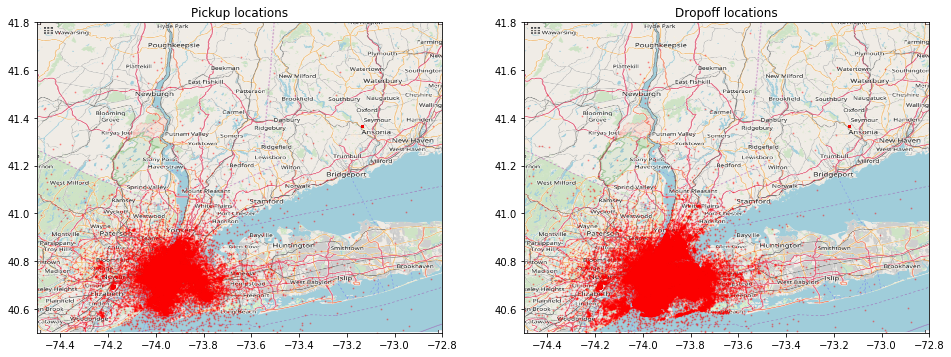

In [65]:
BB = (-74.5, -72.8, 40.5, 41.8)
nyc_map = plt.imread('https://aiblog.nl/download/nyc_-74.5_-72.8_40.5_41.8.png')
plot_on_map(train_data, BB, nyc_map, s=1, alpha=0.3)

### Plot with zoom

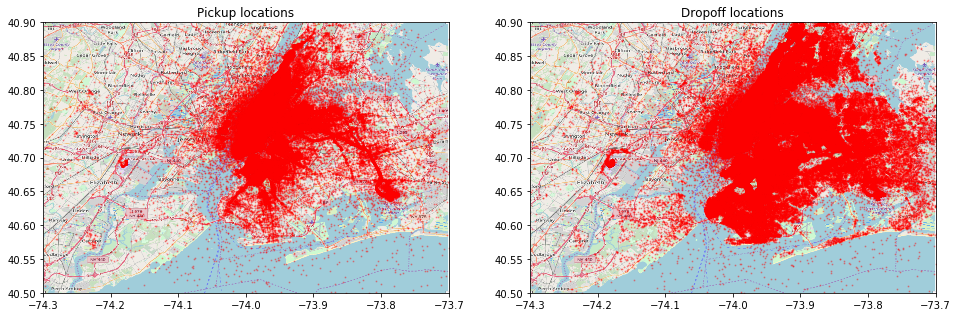

In [66]:
BB_zoom = (-74.3, -73.7, 40.5, 40.9)
nyc_map_zoom = plt.imread('https://aiblog.nl/download/nyc_-74.3_-73.7_40.5_40.9.png')
plot_on_map(train_data, BB_zoom, nyc_map_zoom, s=1, alpha=0.3)

### Plot with zoom filtering by year

In [85]:
years = list(set(train_data.year))

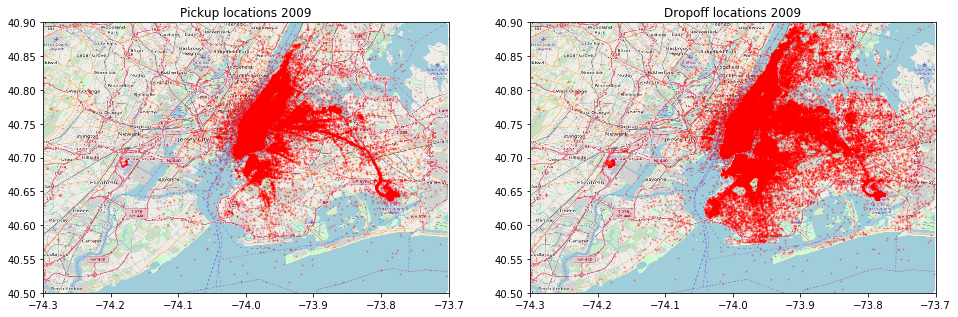

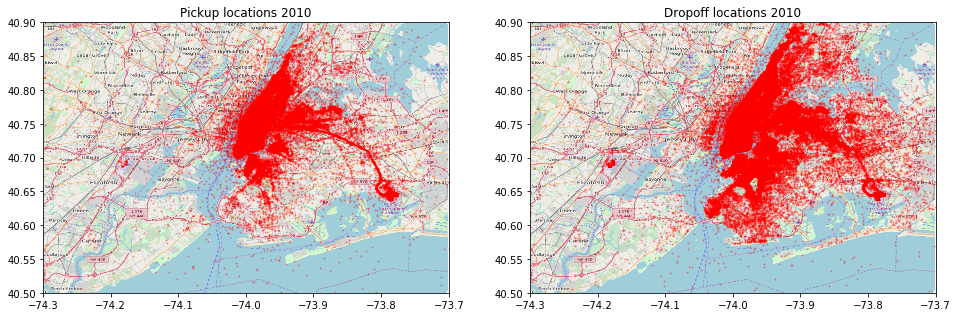

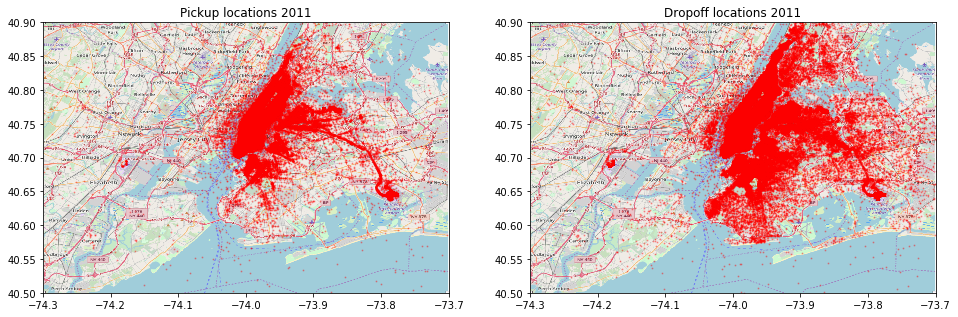

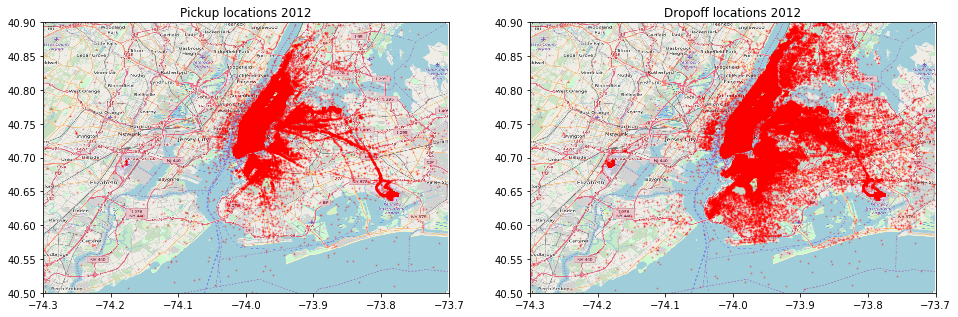

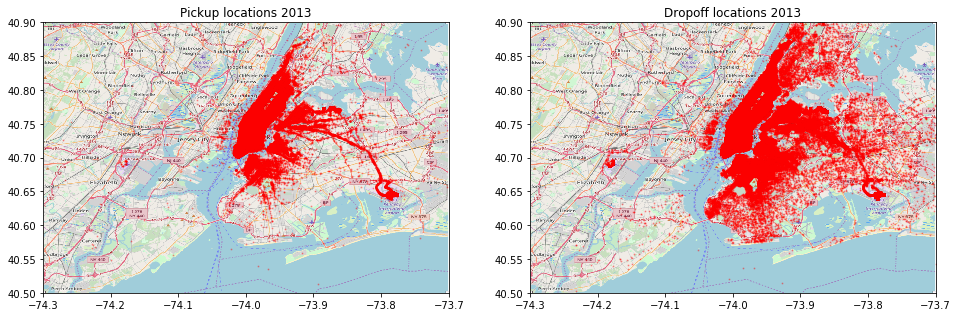

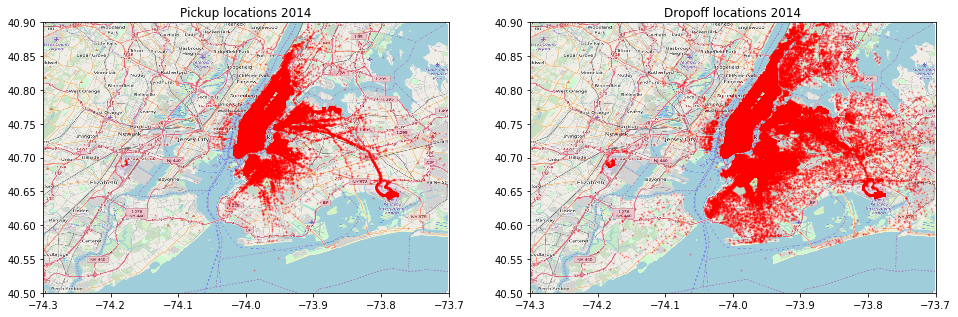

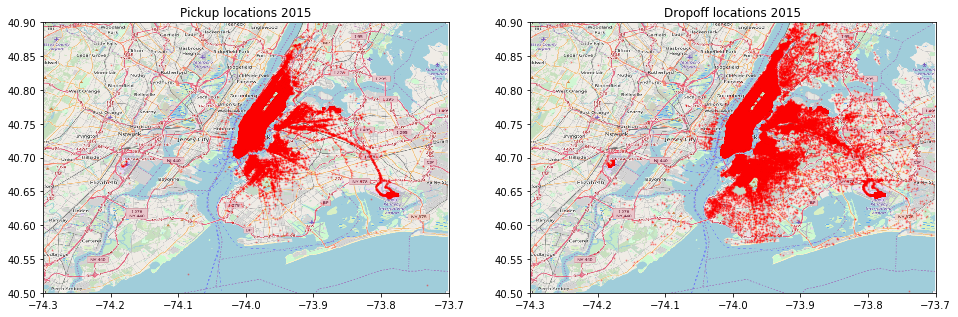

In [100]:
for y in years:
    train_data_y = train_data[train_data.year==y]
    plot_on_map(train_data_y, BB_zoom, nyc_map_zoom, y, s=1, alpha=0.3 )

### Plot with zoom filtering by Hour

In [143]:
groups=[{0: [6,7,8,9]},{1: [10,11,12,13]}, {2: [14,15,16,17]},
        {3: [18,19,20,21]}, {4: [22,23,0,1]}, {5: [2,3,4,5]}]

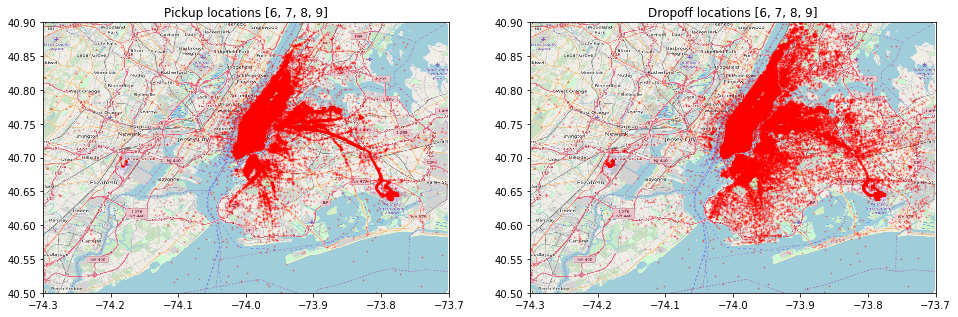

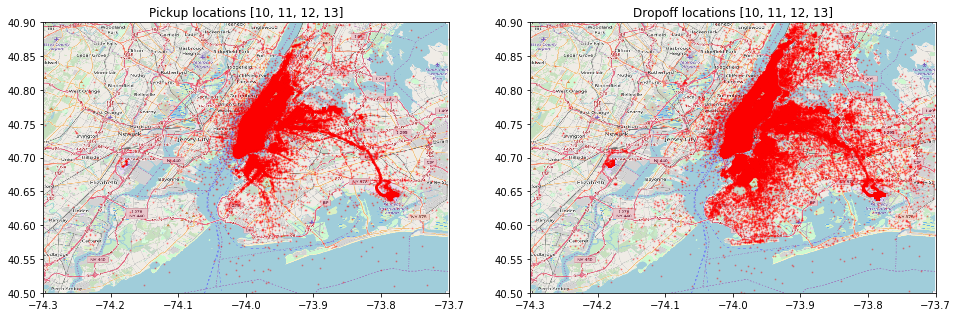

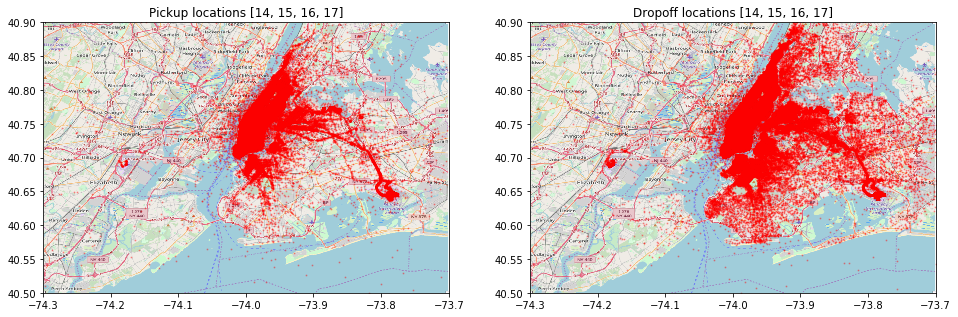

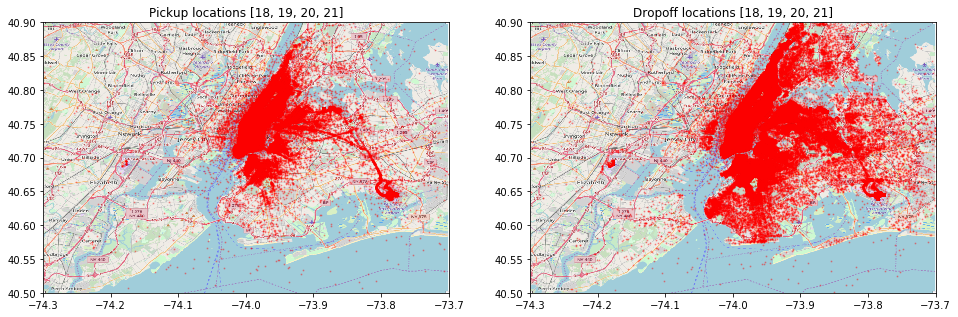

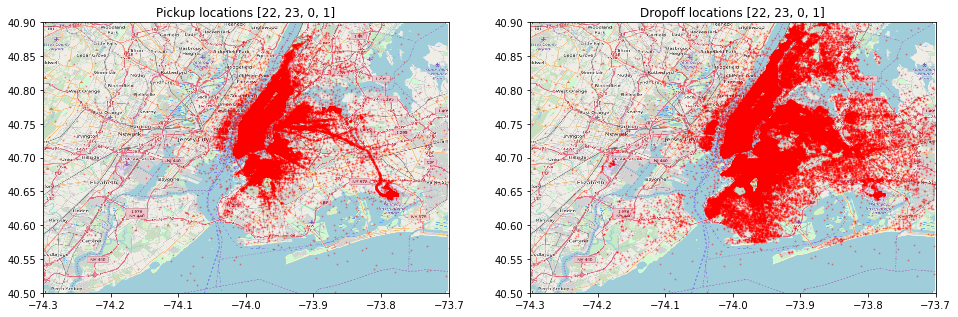

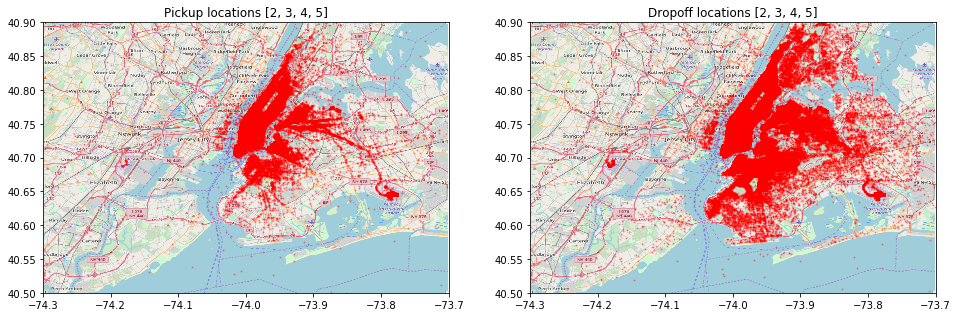

In [148]:
for g in range(len(groups)):
    train_data_y = train_data.loc[train_data.hour.isin(groups[g][g])]
    plot_on_map(train_data_y, BB_zoom, nyc_map_zoom, groups[g][g], s=1, alpha=0.3 )

## Plot with zoom with individual hours

In [379]:
individual_hours = list(set(train_data.hour))

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


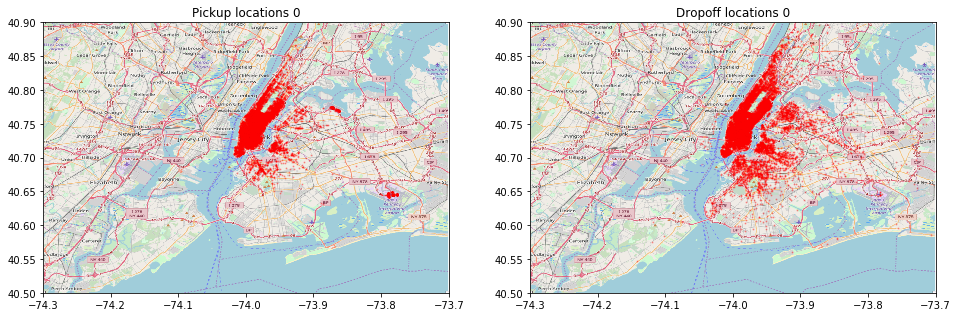

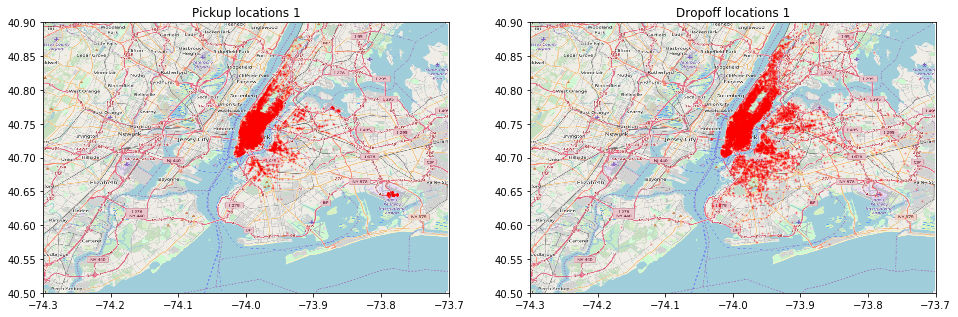

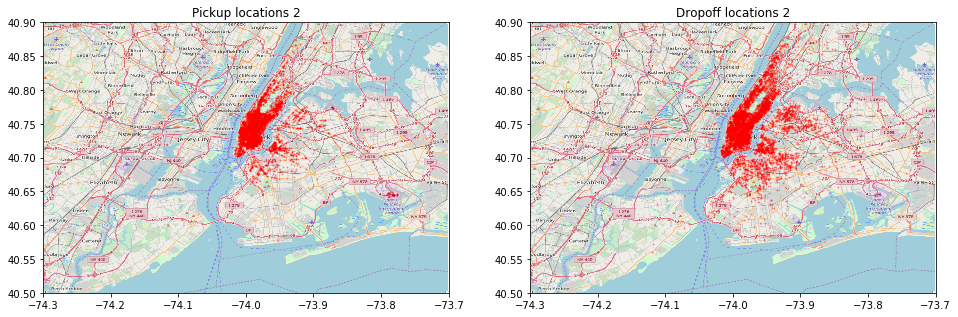

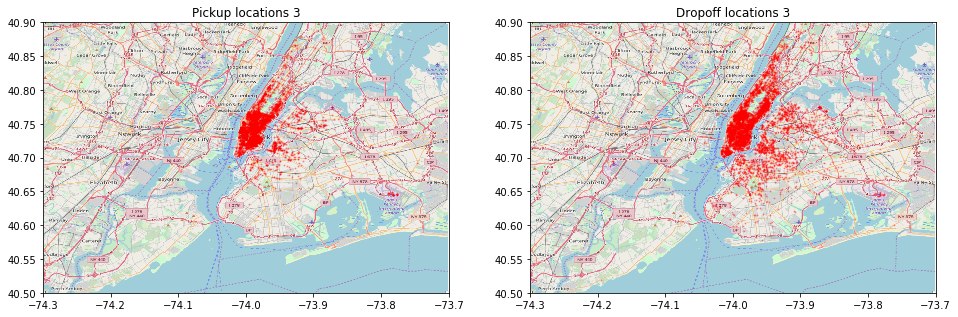

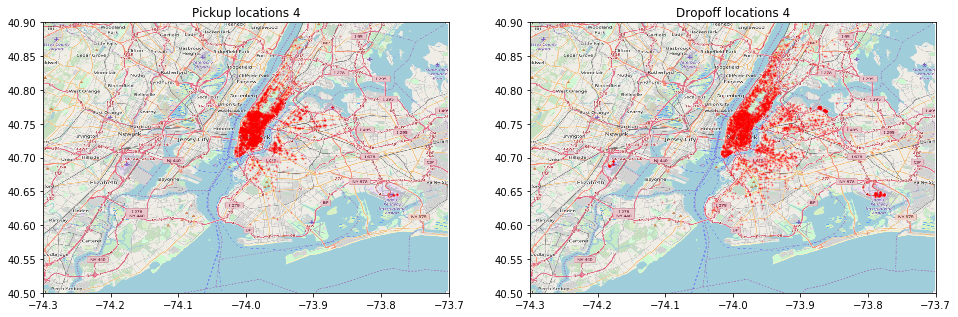

...

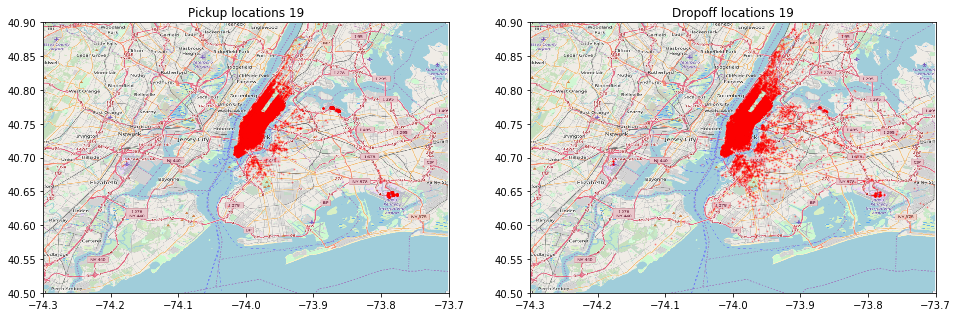

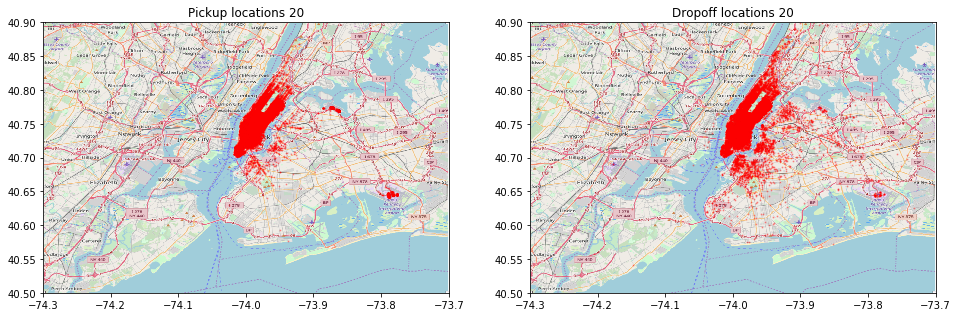

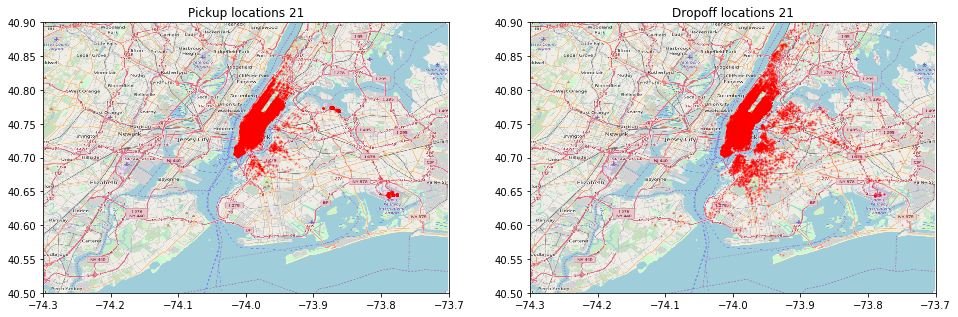

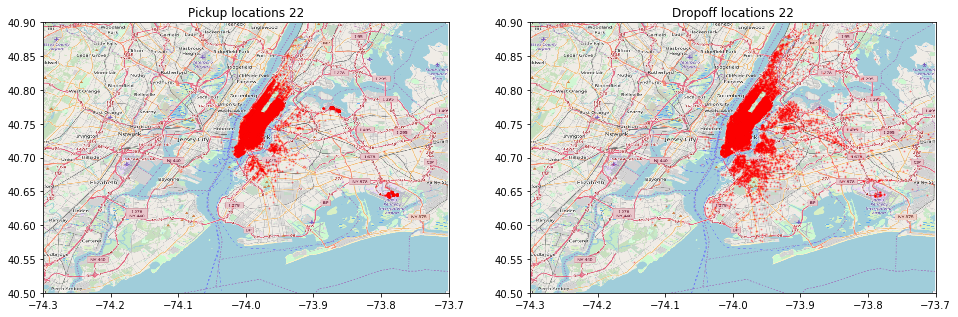

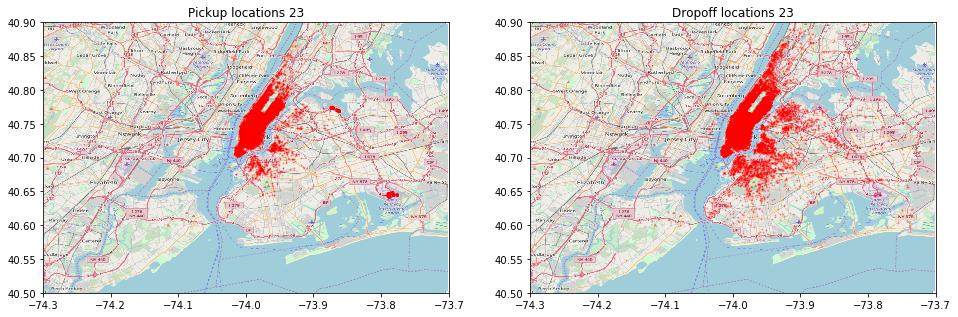

In [384]:
for hours in individual_hours:
    train_data_hours = train_data.loc[train_data.hour.isin([hours]) & train_data.year.isin([2015]) ]
    plot_on_map(train_data_hours, BB_zoom, nyc_map_zoom, hours, s=1, alpha=0.3 )

# Generating new features

Having the initial and final latitude and longitude travel available, it would be interesting to have the total travel distance. We can have this value by calculating the Haversine Formula between our pickup and dropoff latitudes and longitudes and creating a new feature based on this.

The Haversine Formula consists in:

Haversine = sin²(Δφ/2) + cos φ1 ⋅ cos φ2 ⋅ sin²(Δλ/2)


In [14]:
def haversine(lat_1, lon_1, lat_2, lon_2):

      earth_radius = 6372.8 #Earth Radius in Kilometers

      d_lat = math.radians(lat_2 - lat_1)
      d_lon = math.radians(lon_2 - lon_1)
      lat_1 = math.radians(lat_1)
      lat_2 = math.radians(lat_2)

      hav = math.sin(d_lat/2)**2 + math.cos(lat_1)*math.cos(lat_2)*math.sin(d_lon/2)**2
      c = 2*math.asin(math.sqrt(hav))

      return earth_radius * c


#adding 'distance' feature to dataset
train_data['distance'] = train_data.apply(lambda x: haversine(x['pickup_latitude'], x['pickup_longitude'],x['dropoff_latitude'], x['dropoff_longitude']), axis=1)

#Restricting it to positive distances
train_data = train_data[train_data['distance'] > 0] 


# Data Preparing (Training/Test Split)

Here we will split the 'Fare Amount' column in order to use it as a target value. We will create train and test sets in order to train and our models and checking their performance.

In [17]:
train_data.to_csv('data\dataset_taxi.csv', index=False)

In [25]:
target_data.to_csv('data\dataset_taxi_targets.csv', index=False)

The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.


In [ ]:
#Print target data
target_data = train_data['fare_amount']
train_data = train_data.drop(['fare_amount'], axis=1)

x_train, x_test, y_train, y_test = train_test_split(train_data, target_data, test_size = 0.2, random_state = 3)

# Training Regression Models

Considering this is a problem where we need to predict a continuous numeric value (Taxi Fare Price in $) instead of discreet classes, I have selected a regression approach in order to do it.

Instead of using a single model, I chose to use an ensemble method - which combines multiple models to perform a prediction task.

For doing this, I will apply a gradient boosting library called XGBoost, which provides efficient and flexible implementation of a Gradient Boosting approach for regression and classification problems.

The Gradient Boosting approach consists on an ensemble method of weak prediction models (such as decision trees used on this implementation), combining weak predictors interactively into a single stronger predictor.





In [20]:
print('Training XGB Regressor...')

xgb_model = XGBRegressor()

xgb_model.fit(x_train, y_train)

print('Done !')


Training XGB Regressor...


Series.base is deprecated and will be removed in a future version


[14:16:46] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:16:46] WARNING: C:\Jenkins\workspace\xgboost-win64_release_0.90\src\learner.cc:686: Tree method is automatically selected to be 'approx' for faster speed. To use old behavior (exact greedy algorithm on single machine), set tree_method to 'exact'.
Done !


# Explanation with Shap Values

SHAP (SHapley Additive exPlanations) is a unified approach to explain the output of any machine learning model. SHAP connects game theory with local explanations, uniting several previous methods - to see more: [Shap Values](https://github.com/slundberg/shap).

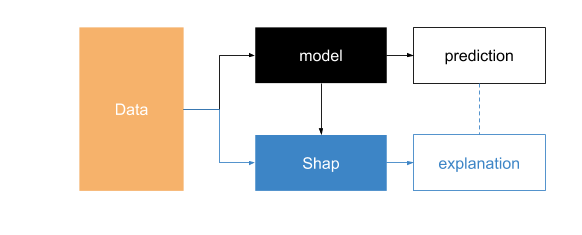

In [21]:
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(x_test)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


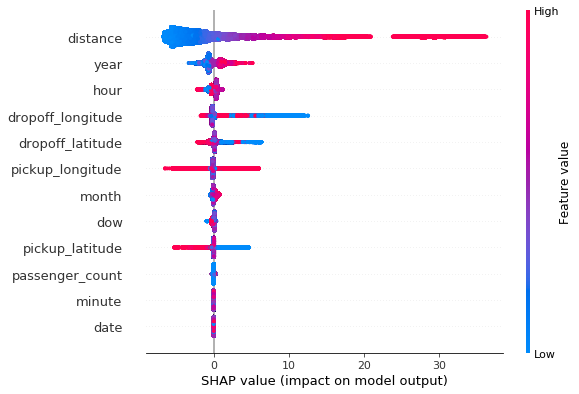

In [22]:
shap.summary_plot(shap_values, x_test)

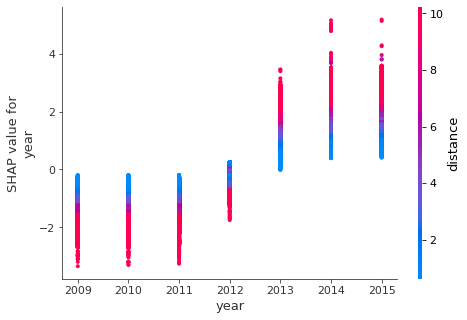

In [30]:
shap.dependence_plot("year", shap_values, x_test, interaction_index="distance")

## Data Base distribution 

Text(0.5, 1.0, 'Taxi Trips Distribution in Weeks')

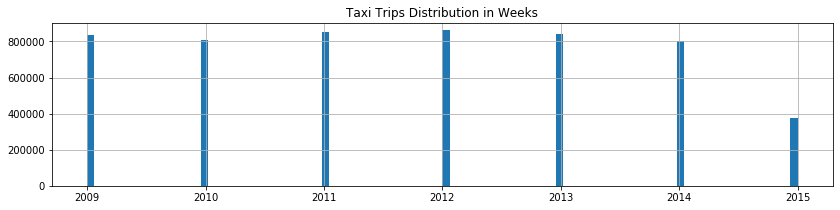

In [31]:
train_data.year.hist(bins=100, figsize=(14,3)).set_title("Taxi Trips Distribution in Weeks")

# Checking the importance of each feature

In order to optimize the use of computational resources, I will check which features were more useful for the model: in other words, the features which the model considered in order to perform predictions.

After doing this, we can consider discarding those features which were not relevant for the model. This way we can achieve similar results in less time and with less consumption of computational resources.

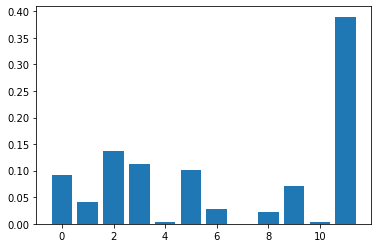

Feature Importance:
0  -  Feature Name : pickup_longitude  , Score:  0.09169055
1  -  Feature Name : pickup_latitude  , Score:  0.041547276
2  -  Feature Name : dropoff_longitude  , Score:  0.13753581
3  -  Feature Name : dropoff_latitude  , Score:  0.11174785
4  -  Feature Name : passenger_count  , Score:  0.0028653296
5  -  Feature Name : year  , Score:  0.1017192
6  -  Feature Name : month  , Score:  0.027220631
7  -  Feature Name : date  , Score:  0.0
8  -  Feature Name : dow  , Score:  0.022922637
9  -  Feature Name : hour  , Score:  0.07020057
10  -  Feature Name : minute  , Score:  0.0028653296
11  -  Feature Name : distance  , Score:  0.38968483


In [16]:
# plot
plt.bar(range(len(xgb_model.feature_importances_)), xgb_model.feature_importances_)
plt.show()

feature_importance = zip(train_data.columns,xgb_model.feature_importances_)
feature_importance = list(feature_importance)

print('Feature Importance:')

for index, feat in enumerate(list(feature_importance)):
    feat_name = feat[0]
    feat_score = feat[1]
    print(index, ' - ' , 'Feature Name :', feat_name, ' , Score: ', feat_score)

# Model Evaluation

For evaluating our model we use Mean Square Error (MSE) and Root Mean Square Error (RMSE), which is a standard method of evaluation deviation of residuals (prediction errors). 



In [17]:
#Validation

def evaluate_models(model_type, train_set, train_target, test_set, test_target):

    ans = model_type.predict(test_set)
    mse = np.mean((ans-test_target)**2)
    
    print('Test Set Mean Squared Error:', mse)
    
    rmse = np.sqrt(mse)
    print('Test Set Root Mean Squared Error', rmse)

    cross_val_generator = ShuffleSplit(n_splits=10)
    cv_score = cross_val_score(model_type, train_set, train_target, scoring='neg_mean_squared_error', cv = cross_val_generator)
    
    cv_mean_score = abs(np.mean(cv_score))
    cv_root_mean_score = [np.sqrt(abs(cv)) for cv in cv_score]
    
    print('Cross-validation (Mean Squared Error):', np.mean(cv_mean_score))
    print('Cross-validation (Root Mean Squared Error):', np.mean(cv_root_mean_score))


In [18]:
evaluate_models(xgb_model, x_train, y_train, x_test, y_test )

Test Set Mean Squared Error: 13.626064900429592
Test Set Root Mean Squared Error 3.6913500105557033
Cross-validation (Mean Squared Error): 13.107177286761697
Cross-validation (Root Mean Squared Error): 3.6195639919154248


In [19]:
#Removing irrelevant features (Score < 0.1)

relevant_features = [feat[0] for feat in feature_importance if feat[1] > 0.1]
train_data_selected_features = train_data[relevant_features] 

x_train_sel_features, x_test_sel_features, y_train_sel_features, y_test_sel_features = train_test_split(train_data_selected_features, target_data, test_size = 0.2, random_state = 3)

In [20]:
print('Training XGB Regressor...')

xgb_model_feats_selected = XGBRegressor()

xgb_model_feats_selected.fit(x_train_sel_features, y_train_sel_features)

print('Done !')

Training XGB Regressor...
Done !


In [21]:
evaluate_models(xgb_model_feats_selected, x_train_sel_features, y_train_sel_features, x_test_sel_features, y_test_sel_features )

Test Set Mean Squared Error: 14.352954220712961
Test Set Root Mean Squared Error 3.788529295216412
Cross-validation (Mean Squared Error): 13.980250761092538
Cross-validation (Root Mean Squared Error): 3.7387147955284084


# Back-testing

The back-testing is a technique to evaluate the machine learning models when you want to consider temporal components.

You can use Back-testing in **ANY** machine learning problem that you have temporal components. For example, if you work with sentiment analysis with social network data, you can consider collected date as component.

## Dynamic

This approach suggests training models on successive (potentially sliding) windows of data, and making predictions for the following period.

<div>
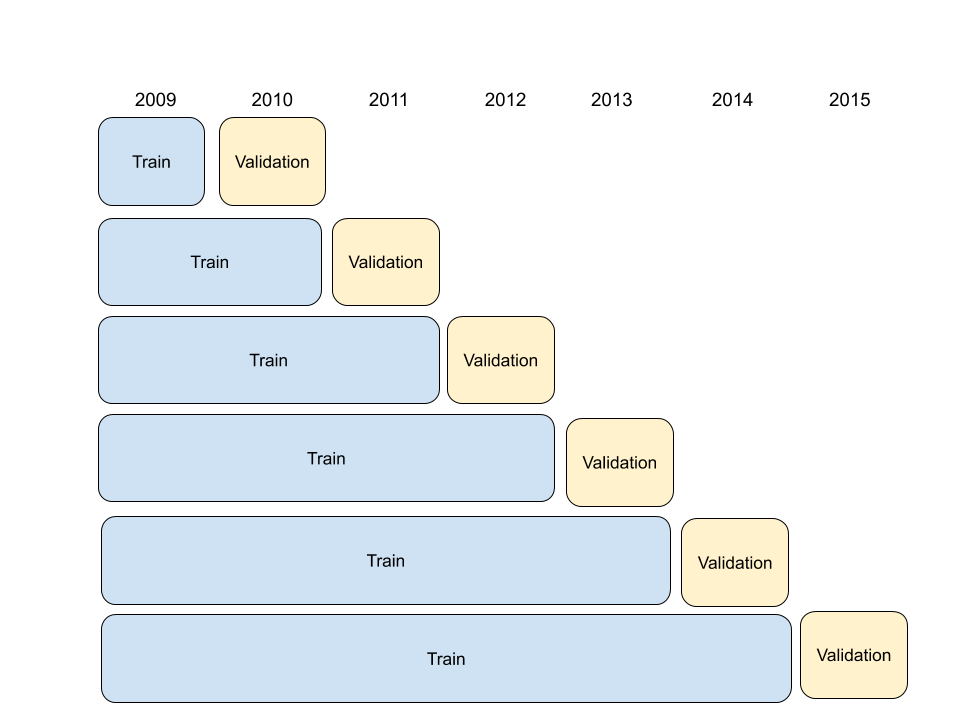
</div>


In [123]:
combinations = [{"train":years[0:y], "test":[years[y]]} for y in range(len(years))]

In [267]:
combinations[1:]

[{'train': [2009], 'test': [2010]},
 {'train': [2009, 2010], 'test': [2011]},
 {'train': [2009, 2010, 2011], 'test': [2012]},
 {'train': [2009, 2010, 2011, 2012], 'test': [2013]},
 {'train': [2009, 2010, 2011, 2012, 2013], 'test': [2014]},
 {'train': [2009, 2010, 2011, 2012, 2013, 2014], 'test': [2015]}]

In [204]:
%%time
result={}

for con in combinations[1:]:

    train_data_filtred = train_data.loc[train_data.year.isin(con['train'])]  
    test_data_filtred  = train_data.loc[train_data.year.isin(con['test'])]
    
    X_train  = train_data_filtred.drop(['fare_amount'], axis=1)
    y_train  = train_data_filtred['fare_amount']
    
    X_test  = test_data_filtred.drop(['fare_amount'], axis=1)
    y_test  = test_data_filtred['fare_amount']
    
    xgb_model = XGBRegressor()

    xgb_model.fit(X_train, y_train)
    y_pred  =  xgb_model.predict(X_test)
    
    result.update({str(con['test']): r2_score(y_test, y_pred)})

Series.base is deprecated and will be removed in a future version
Series.base is deprecated and will be removed in a future version


[13:48:57] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


Series.base is deprecated and will be removed in a future version
Series.base is deprecated and will be removed in a future version


[13:51:08] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


Series.base is deprecated and will be removed in a future version
Series.base is deprecated and will be removed in a future version


[13:55:46] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


Series.base is deprecated and will be removed in a future version
Series.base is deprecated and will be removed in a future version


[14:02:57] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


Series.base is deprecated and will be removed in a future version
Series.base is deprecated and will be removed in a future version


[14:12:41] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:12:41] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/learner.cc:686: Tree method is automatically selected to be 'approx' for faster speed. To use old behavior (exact greedy algorithm on single machine), set tree_method to 'exact'.


Series.base is deprecated and will be removed in a future version
Series.base is deprecated and will be removed in a future version


[14:37:00] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[14:37:00] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/learner.cc:686: Tree method is automatically selected to be 'approx' for faster speed. To use old behavior (exact greedy algorithm on single machine), set tree_method to 'exact'.
CPU times: user 1h 16min 50s, sys: 17.5 s, total: 1h 17min 7s
Wall time: 1h 17min 26s


### Result Dynamic

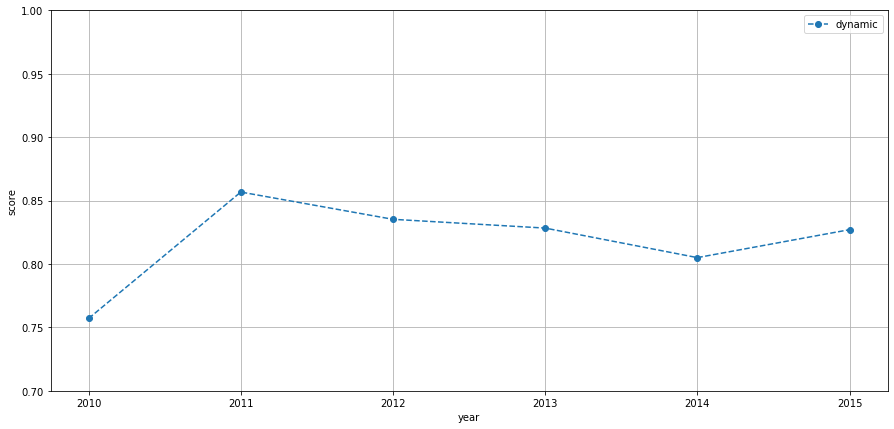

In [413]:
plt.figure(figsize=(15,7))
plt.plot(years[1:], list(result.values()) ,marker = 'o', linestyle = '--', label = "dynamic")
plt.legend(loc = 'best')
plt.yticks(np.arange(0.7, 1, step=0.05))
plt.xlabel("year")
plt.ylabel("score")
plt.grid()

## Static

This approach suggests training models on successive (potentially sliding) windows of data, and making predictions for the following period.


<div>
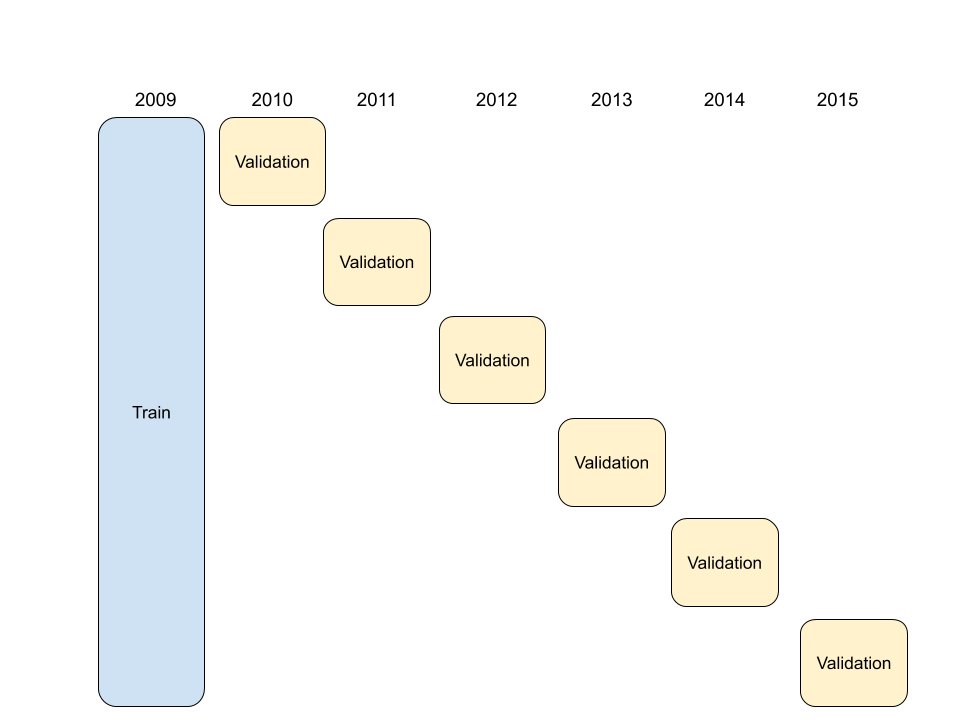
</div>

In [268]:
combinations_static = [{"train":[years[0]], "test":[years[y]]} for y in range(len(years))]

In [302]:
final_result_static={}
count = 1
for year in years:

    train_data_filtred = train_data.loc[train_data.year.isin([year])]  
    X_train  = train_data_filtred.drop(['fare_amount'], axis=1)
    y_train  = train_data_filtred['fare_amount']

    xgb_model = XGBRegressor()
    xgb_model.fit(X_train, y_train)

    result_static={}
    for con in combinations_static[count:]:
        test_data_filtred  = train_data.loc[train_data.year.isin(con['test'])]
        X_test  = test_data_filtred.drop(['fare_amount'], axis=1)
        y_test  = test_data_filtred['fare_amount']


        y_pred  =  xgb_model.predict(X_test)

        result_static.update({str(con['test']): r2_score(y_test, y_pred)})
    final_result_static.update({year:result_static})
    count+=1

Series.base is deprecated and will be removed in a future version
Series.base is deprecated and will be removed in a future version


[21:52:20] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


Series.base is deprecated and will be removed in a future version
Series.base is deprecated and will be removed in a future version


[21:55:03] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


Series.base is deprecated and will be removed in a future version
Series.base is deprecated and will be removed in a future version


[21:57:39] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


Series.base is deprecated and will be removed in a future version
Series.base is deprecated and will be removed in a future version


[22:00:33] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


Series.base is deprecated and will be removed in a future version
Series.base is deprecated and will be removed in a future version


[22:03:13] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


Series.base is deprecated and will be removed in a future version
Series.base is deprecated and will be removed in a future version


[22:05:33] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


Series.base is deprecated and will be removed in a future version
Series.base is deprecated and will be removed in a future version


[22:07:34] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [336]:
keys_   = [[k2[1:5] for k2, v2 in v.items()] for k,v in final_result_static.items()]
values_ = [[v2 for k2, v2 in v.items()] for k,v in final_result_static.items()]

In [207]:
import pickle

In [385]:
with open('final_result_static.pickle', 'wb') as f:
    pickle.dump(final_result_static, f)

### Result Static

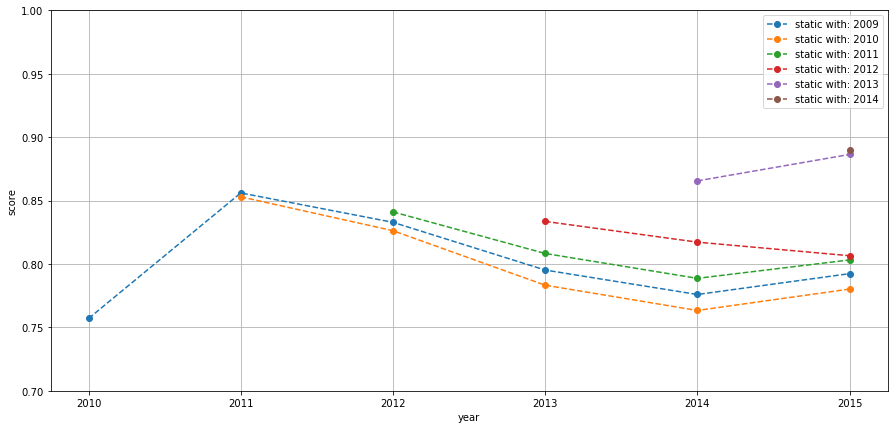

In [406]:
plt.figure(figsize=(15,7))
for ks,vs, ys in zip(keys_[0:6], values_[0:6], list(final_result_static.keys())[0:6]):
    plt.plot(ks, vs ,marker = 'o', linestyle = '--', label = "static with: "+ str(ys))
plt.yticks(np.arange(0.7, 1, step=0.05))    
plt.legend(loc = 'best')
plt.xlabel("year")
plt.ylabel("score")
plt.grid()

## Train with all data
It’s a simple approach to split arrays or matrices into random train and tests subsets.

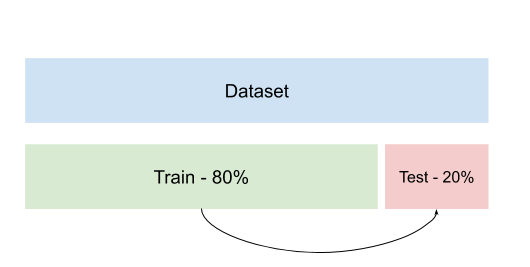

In [367]:
target_data_ = train_data['fare_amount']
train_data_ = train_data.drop(['fare_amount'], axis=1)

x_train, x_test, y_train, y_test = train_test_split(train_data_, target_data_, test_size = 0.2, random_state = 3)

In [368]:
xgb_model = XGBRegressor()
xgb_model.fit(x_train, y_train)

[22:44:54] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[22:44:54] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/learner.cc:686: Tree method is automatically selected to be 'approx' for faster speed. To use old behavior (exact greedy algorithm on single machine), set tree_method to 'exact'.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [369]:
y_pred  =  xgb_model.predict(x_test)

In [370]:
r2_score(y_test, y_pred)

0.8125862166663083

## Train without 2010

In [374]:
target_data_without_2010 = train_data.loc[train_data.year!=2010]
target_data_ = target_data_without_2010['fare_amount']
train_data_ = target_data_without_2010.drop(['fare_amount'], axis=1)

x_train, x_test, y_train, y_test = train_test_split(train_data_, target_data_, test_size = 0.2, random_state = 3)

In [375]:
xgb_model = XGBRegressor()
xgb_model.fit(x_train, y_train)

Series.base is deprecated and will be removed in a future version


[23:14:45] WARNING: /usr/local/miniconda/conda-bld/xgboost_1566327371504/work/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

In [376]:
y_pred  =  xgb_model.predict(x_test)
r2_score(y_test, y_pred)

0.8654855531385373

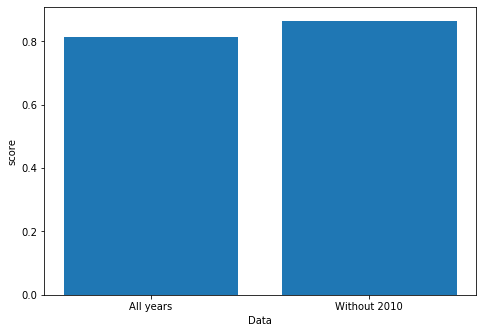

In [410]:
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
langs = ['All years', 'Without 2010']
students = [0.8125862166663083,0.8654855531385373]
ax.bar(langs,students)
plt.xlabel("Data")
plt.ylabel("score")
plt.show()

# References
- Thais Almeida, Bruno Ábia, Eduardo Nakamura, Fabíola Nakamura (2017, October). Detecting hate, offensive, and regular speech in short comments. In Proceedings of the 23rd Brazillian Symposium on Multimedia and the Web (pp. 225-228).

- Shapley sampling values: Strumbelj, Erik, and Igor Kononenko. "Explaining prediction models and individual predictions with feature contributions." Knowledge and information systems 41.3 (2014): 647-665.

- LIME: Ribeiro, Marco Tulio, Sameer Singh, and Carlos Guestrin. "Why should i trust you?: Explaining the predictions of any classifier." Proceedings of the 22nd ACM SIGKDD International Conference on Knowledge Discovery and Data Mining. ACM, 2016.

- Shap Values: https://github.com/slundberg/shap
- Back-testing: https://machinelearningmastery.com/backtest-machine-learning-models-time-series-forecasting/
- Dataset: https://www.kaggle.com/c/new-york-city-taxi-fare-prediction/overview

# Acknowledgment

- Bruno Rebanda
- My big friend Msc. Fábio Rezende - Help me with the code
- Eric Levesque - My Manager
- Fábio Marinho
- PyData Manaus
- André Segala
- DevDojo Academy